# **Installation**

In [1]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning)

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
pd.options.mode.chained_assignment = None 

import optuna
import optuna.visualization as ov

from bokeh.io import export_svgs
from bokeh.layouts import row, gridplot
from bokeh.plotting import figure, show
from bokeh.palettes import viridis, cividis
from bokeh.models import ColumnDataSource, Range1d
viridis_palette = viridis(256)

from sklearn.inspection import PartialDependenceDisplay
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import StackingRegressor, GradientBoostingRegressor, AdaBoostRegressor, RandomForestRegressor, HistGradientBoostingRegressor
from lightgbm import LGBMRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.linear_model import RidgeCV
from sklearn.pipeline import Pipeline
from sklearn.dummy import DummyRegressor
from sklearn.compose import ColumnTransformer
from sklearn.inspection import permutation_importance, PartialDependenceDisplay
from sklearn.preprocessing import OneHotEncoder, RobustScaler
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_predict, cross_val_score

from textwrap import wrap
from matplotlib.cm import get_cmap

C:\Users\decla\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# **Data Import**

In [2]:
# Create a DataFrame from CSV data
result_df = pd.read_csv("FE_golf.csv")

# **Optuna**

TODO: Prune

In [3]:
result_df = result_df[result_df['from_location_scorer'] == 'Green']

feature_cols = ["from_location_laser",'from_location_scorer','slope','elevation','round','par_value','distance_to_pin','dist_from_edge','pin_minus_edge','SSI','hole_completeness','dist_from_center']#,'distance_bins_putting','edge_bins_putting']
X = result_df.loc[:, feature_cols]

categorical_cols = ["from_location_laser",'from_location_scorer','round','par_value','slope','elevation']
X = pd.get_dummies(X, columns=categorical_cols, drop_first=True)

target_cols = ['strokes_to_hole_out'] 
y = result_df.loc[:, target_cols]

# Extract the columns for stratification
stratify_cols = ['distance_bins_putting']
stratify_data = result_df[stratify_cols]

# Split the data, using 'stratify_data' for stratification
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)#, stratify=stratify_data)
# X_train = X_train.drop(columns=['distance_bins_putting'])
# X_valid = X_valid.drop(columns=['distance_bins_putting'])

# GradientBoostingRegressor

In [4]:
def objective(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 150, 400),
        "learning_rate": trial.suggest_loguniform("learning_rate", 0.01, 0.03),
        "max_depth": trial.suggest_int("max_depth", 3, 7),
        "subsample": trial.suggest_uniform("subsample", 0.4, 0.8),
        "min_samples_split": trial.suggest_int("min_samples_split", 4, 8),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 3, 7),
        "max_features": trial.suggest_uniform("max_features", 0.15, 0.7),
    }

    model = GradientBoostingRegressor(**params, random_state=42)

    model.fit(X_train, y_train)
    y_pred = model.predict(X_valid)

    mse = mean_squared_error(y_valid, y_pred)
    return mse

# Create and run the Optuna study
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100, timeout=600)  # You can adjust the number of trials

# Print the best hyperparameters
print('Best trial:')
GradientBoostingRegressor_best_trial = study.best_trial
print('  Value: {:.4f}'.format(GradientBoostingRegressor_best_trial.value))
print('  Params: ')
for key, value in GradientBoostingRegressor_best_trial.params.items():
    print('    {}: {}'.format(key, value))


[I 2024-04-28 11:55:15,516] A new study created in memory with name: no-name-62b8490f-ca5b-47ac-9436-010947f63e91
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\3921482218.py:4: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.01, 0.03),
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\3921482218.py:6: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "subsample": trial.suggest_uniform("subsample", 0.4, 0.8),
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\3921482218.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. U

Best trial:
  Value: 0.0168
  Params: 
    n_estimators: 253
    learning_rate: 0.021839536027273173
    max_depth: 3
    subsample: 0.7652136446336926
    min_samples_split: 7
    min_samples_leaf: 5
    max_features: 0.5578703731710225


In [5]:
ov.plot_param_importances(study)

In [6]:
ov.plot_contour(study, params=["n_estimators", "max_features"])


# LGBMRegressor

In [7]:
def objective(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 600, 800),
        "learning_rate": trial.suggest_loguniform("learning_rate", 0.01, 0.03),
        "max_depth": trial.suggest_int("max_depth", 2, 5),
        "subsample": trial.suggest_uniform("subsample", 0.5, 0.8),
        "colsample_bytree": trial.suggest_uniform("colsample_bytree", 0.6, 1.0),
        "min_child_samples": trial.suggest_int("min_child_samples", 20, 65),
        "reg_alpha": trial.suggest_loguniform("reg_alpha", 1e-8, 1.0),
        "reg_lambda": trial.suggest_loguniform("reg_lambda", 1e-8, 1.0),
    }

    model = LGBMRegressor(**params, random_state=42)

    model.fit(X_train, y_train)
    y_pred = model.predict(X_valid)

    mse = mean_squared_error(y_valid, y_pred)
    return mse

# Create and run the Optuna study
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100, timeout=600)  # You can adjust the number of trials

# Print the best hyperparameters
print('Best trial:')
LGBMRegressor_best_trial = study.best_trial
print('  Value: {:.4f}'.format(LGBMRegressor_best_trial.value))
print('  Params: ')
for key, value in LGBMRegressor_best_trial.params.items():
    print('    {}: {}'.format(key, value))

[I 2024-04-28 11:56:53,199] A new study created in memory with name: no-name-80af4120-7473-48c2-a712-2aed3382ce5b
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform ha

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1334
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 12
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2024-04-28 11:56:53,612] Trial 0 finished with value: 0.019764015506453344 and parameters: {'n_estimators': 767, 'learning_rate': 0.012352004372620887, 'max_depth': 5, 'subsample': 0.6915884332087571, 'colsample_bytree': 0.6603912238678955, 'min_child_samples': 46, 'reg_alpha': 0.0015628243122811295, 'reg_lambda': 1.3382888612716815e-06}. Best is trial 0 with value: 0.019764015506453344.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarnin

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1334
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 12
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:56:54,156] Trial 3 finished with value: 0.01989969177370504 and parameters: {'n_estimators': 782, 'learning_rate': 0.017941738476004953, 'max_depth': 2, 'subsample': 0.5987798305234573, 'colsample_bytree': 0.6906945289267113, 'min_child_samples': 60, 'reg_alpha': 0.01704602465284635, 'reg_lambda': 0.01189007034756903}. Best is trial 1 with value: 0.018630389007749455.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-28 11:56:54,515] Trial 5 finished with value: 0.02037603180879527 and parameters: {'n_estimators': 751, 'learning_rate': 0.025313373314496082, 'max_depth': 3, 'subsample': 0.6848010490677333, 'colsample_bytree': 0.601165596740914, 'min_child_samples': 52, 'reg_alpha': 2.8939420554044602e-08, 'reg_lambda': 0.5502032036908063}. Best is trial 1 with value: 0.018630389007749455.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-28 11:56:54,991] Trial 7 finished with value: 0.01885395087616802 and parameters: {'n_estimators': 798, 'learning_rate': 0.014878220826320952, 'max_depth': 5, 'subsample': 0.7096337307132584, 'colsample_bytree': 0.9692705817971425, 'min_child_samples': 36, 'reg_alpha': 0.06936417565454694, 'reg_lambda': 0.0001656969555026522}. Best is trial 1 with value: 0.018630389007749455.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1334
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 12
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:56:55,472] Trial 9 finished with value: 0.01967240448362705 and parameters: {'n_estimators': 675, 'learning_rate': 0.013008869240251204, 'max_depth': 4, 'subsample': 0.7572955877865092, 'colsample_bytree': 0.9851172441193359, 'min_child_samples': 58, 'reg_alpha': 0.6021177234738393, 'reg_lambda': 0.002578612375488325}. Best is trial 1 with value: 0.018630389007749455.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-28 11:56:55,893] Trial 10 finished with value: 0.019266479416822913 and parameters: {'n_estimators': 732, 'learning_rate': 0.010209564745638144, 'max_depth': 4, 'subsample': 0.5130436473149124, 'colsample_bytree': 0.8163273281211061, 'min_child_samples': 32, 'reg_alpha': 3.6200961463475894e-06, 'reg_lambda': 1.593039360372651e-08}. Best is trial 1 with value: 0.018630389007749455.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarni

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000187 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2024-04-28 11:56:56,211] Trial 11 finished with value: 0.018816628567423152 and parameters: {'n_estimators': 615, 'learning_rate': 0.015241656286538579, 'max_depth': 5, 'subsample': 0.7111119478101671, 'colsample_bytree': 0.9912453427398425, 'min_child_samples': 36, 'reg_alpha': 0.019000244216305837, 'reg_lambda': 9.695929474477029e-05}. Best is trial 1 with value: 0.018630389007749455.


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-28 11:56:56,875] Trial 13 finished with value: 0.01990509722703575 and parameters: {'n_estimators': 607, 'learning_rate': 0.01909915855717535, 'max_depth': 5, 'subsample': 0.7248711901711243, 'colsample_bytree': 0.8210308265403923, 'min_child_samples': 25, 'reg_alpha': 0.0007807268174317416, 'reg_lambda': 4.272151422242967e-06}. Best is trial 1 with value: 0.018630389007749455.


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM]

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-28 11:56:57,649] Trial 16 finished with value: 0.01945264480803473 and parameters: {'n_estimators': 649, 'learning_rate': 0.020301574913500514, 'max_depth': 3, 'subsample': 0.6751619377911988, 'colsample_bytree': 0.937820096590848, 'min_child_samples': 28, 'reg_alpha': 4.661596325197411e-06, 'reg_lambda': 0.026200979540933}. Best is trial 14 with value: 0.01839168894280111.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1334
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 12
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001798 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1334
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 12
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 11:56:58,732] Trial 20 finished with value: 0.019210958952441317 and parameters: {'n_estimators': 730, 'learning_rate': 0.015731355431362826, 'max_depth': 3, 'subsample': 0.6603787444880653, 'colsample_bytree': 0.7858651728531274, 'min_child_samples': 29, 'reg_alpha': 2.9565100334799964e-07, 'reg_lambda': 0.0685840698299558}. Best is trial 14 with value: 0.01839168894280111.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1334
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 12
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000617 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 11:56:59,948] Trial 24 finished with value: 0.018032334559636348 and parameters: {'n_estimators': 797, 'learning_rate': 0.021289487748522566, 'max_depth': 3, 'subsample': 0.5506218626433591, 'colsample_bytree': 0.8548988399319875, 'min_child_samples': 38, 'reg_alpha': 1.5463413327504412e-05, 'reg_lambda': 0.0017389520229792314}. Best is trial 24 with value: 0.018032334559636348.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000486 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 11:57:00,255] Trial 25 finished with value: 0.019203177394343397 and parameters: {'n_estimators': 756, 'learning_rate': 0.0213986848983165, 'max_depth': 2, 'subsample': 0.5339450069301099, 'colsample_bytree': 0.8452813340046197, 'min_child_samples': 31, 'reg_alpha': 4.351558788383149e-05, 'reg_lambda': 0.0012642004448063526}. Best is trial 24 with value: 0.018032334559636348.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000417 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1334
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 12
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:00,773] Trial 26 finished with value: 0.01992136701987144 and parameters: {'n_estimators': 797, 'learning_rate': 0.021655973836285484, 'max_depth': 4, 'subsample': 0.5672539721203675, 'colsample_bytree': 0.7871025729124427, 'min_child_samples': 47, 'reg_alpha': 1.7573102090228763e-05, 'reg_lambda': 1.664611275209725e-05}. Best is trial 24 with value: 0.018032334559636348.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarni

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:01,084] Trial 27 finished with value: 0.019612641175530406 and parameters: {'n_estimators': 762, 'learning_rate': 0.026597635433382005, 'max_depth': 3, 'subsample': 0.5021025244488906, 'colsample_bytree': 0.8325717219645112, 'min_child_samples': 25, 'reg_alpha': 0.0002306321150876317, 'reg_lambda': 2.2326755469138857e-06}. Best is trial 24 with value: 0.018032334559636348.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarn

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1334
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 12
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:01,411] Trial 28 finished with value: 0.018842306411873237 and parameters: {'n_estimators': 790, 'learning_rate': 0.021756810284955665, 'max_depth': 2, 'subsample': 0.5320819062697545, 'colsample_bytree': 0.871288701887484, 'min_child_samples': 54, 'reg_alpha': 1.2195719409890678e-05, 'reg_lambda': 0.0050130676111860804}. Best is trial 24 with value: 0.018032334559636348.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarni

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1334
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 12
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:01,935] Trial 29 finished with value: 0.019465398955776952 and parameters: {'n_estimators': 771, 'learning_rate': 0.019260514193877486, 'max_depth': 4, 'subsample': 0.5917963540617324, 'colsample_bytree': 0.9207991536606532, 'min_child_samples': 45, 'reg_alpha': 1.2471102901772994e-06, 'reg_lambda': 1.64737911072152e-07}. Best is trial 24 with value: 0.018032334559636348.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarni

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 11:57:02,252] Trial 30 finished with value: 0.018833602921986298 and parameters: {'n_estimators': 747, 'learning_rate': 0.01612202081427001, 'max_depth': 3, 'subsample': 0.5530941676714733, 'colsample_bytree': 0.7525796205890838, 'min_child_samples': 35, 'reg_alpha': 0.00024363168950694165, 'reg_lambda': 6.983885831204929e-07}. Best is trial 24 with value: 0.018032334559636348.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarni

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:02,645] Trial 31 finished with value: 0.017983062376654133 and parameters: {'n_estimators': 772, 'learning_rate': 0.022376485210154347, 'max_depth': 3, 'subsample': 0.6082557514863876, 'colsample_bytree': 0.9517324663374563, 'min_child_samples': 39, 'reg_alpha': 5.5518535516667444e-06, 'reg_lambda': 2.668353338565517e-05}. Best is trial 31 with value: 0.017983062376654133.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarn

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000494 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000279 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:03,397] Trial 33 finished with value: 0.018190481072146148 and parameters: {'n_estimators': 772, 'learning_rate': 0.02352177914884759, 'max_depth': 3, 'subsample': 0.6061600584451737, 'colsample_bytree': 0.9573496154727075, 'min_child_samples': 39, 'reg_alpha': 1.1992137007828056e-06, 'reg_lambda': 5.508105073490361e-05}. Best is trial 31 with value: 0.017983062376654133.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000641 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1334
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 12
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:03,880] Trial 34 finished with value: 0.019625468888985493 and parameters: {'n_estimators': 776, 'learning_rate': 0.022905976626407226, 'max_depth': 3, 'subsample': 0.6091040715097328, 'colsample_bytree': 0.9597467474176118, 'min_child_samples': 43, 'reg_alpha': 8.960300989991602e-08, 'reg_lambda': 2.6324915506969223e-05}. Best is trial 31 with value: 0.017983062376654133.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001419 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1334
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 12
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:04,381] Trial 35 finished with value: 0.0194278516711213 and parameters: {'n_estimators': 781, 'learning_rate': 0.027386244234352587, 'max_depth': 3, 'subsample': 0.5908851420001574, 'colsample_bytree': 0.914941257722433, 'min_child_samples': 49, 'reg_alpha': 9.642956868133122e-07, 'reg_lambda': 0.00011460753357754916}. Best is trial 31 with value: 0.017983062376654133.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000203 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1334
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 12
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:04,794] Trial 36 finished with value: 0.01984527631030874 and parameters: {'n_estimators': 718, 'learning_rate': 0.024948406510262262, 'max_depth': 4, 'subsample': 0.6126647667934777, 'colsample_bytree': 0.8832049953372876, 'min_child_samples': 42, 'reg_alpha': 1.026541953712976e-07, 'reg_lambda': 2.7734424618601242e-05}. Best is trial 31 with value: 0.017983062376654133.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000626 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

[I 2024-04-28 11:57:05,411] Trial 37 finished with value: 0.018603500410598887 and parameters: {'n_estimators': 769, 'learning_rate': 0.0231960370244538, 'max_depth': 3, 'subsample': 0.581309911876194, 'colsample_bytree': 0.997822227745561, 'min_child_samples': 33, 'reg_alpha': 1.778971559159475e-08, 'reg_lambda': 2.284974261575707e-06}. Best is trial 31 with value: 0.017983062376654133.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-28 11:57:05,888] Trial 38 finished with value: 0.017933532307039566 and parameters: {'n_estimators': 786, 'learning_rate': 0.018168386472267324, 'max_depth': 3, 'subsample': 0.5452033191488828, 'colsample_bytree': 0.9700401231311253, 'min_child_samples': 39, 'reg_alpha': 2.5781838723075997e-06, 'reg_lambda': 0.0002780315376402854}. Best is trial 38 with value: 0.017933532307039566.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-28 11:57:06,453] Trial 39 finished with value: 0.020267146727835757 and parameters: {'n_estimators': 789, 'learning_rate': 0.017552744669366616, 'max_depth': 4, 'subsample': 0.5288367253164727, 'colsample_bytree': 0.6065096982695064, 'min_child_samples': 45, 'reg_alpha': 2.366945452939043e-06, 'reg_lambda': 0.017996288007279957}. Best is trial 38 with value: 0.017933532307039566.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarnin

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000202 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:06,849] Trial 40 finished with value: 0.01964907631217998 and parameters: {'n_estimators': 785, 'learning_rate': 0.0191613054007633, 'max_depth': 3, 'subsample': 0.5539108322943063, 'colsample_bytree': 0.9723918490710612, 'min_child_samples': 30, 'reg_alpha': 7.843642303514002e-08, 'reg_lambda': 0.002667554024356218}. Best is trial 38 with value: 0.017933532307039566.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-28 11:57:07,333] Trial 41 finished with value: 0.01795467651357984 and parameters: {'n_estimators': 766, 'learning_rate': 0.02540214524312632, 'max_depth': 3, 'subsample': 0.6011191689773157, 'colsample_bytree': 0.9534540865090618, 'min_child_samples': 38, 'reg_alpha': 6.103840218015868e-07, 'reg_lambda': 0.0002475960244315484}. Best is trial 38 with value: 0.017933532307039566.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000458 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 11:57:07,821] Trial 42 finished with value: 0.018681214201775296 and parameters: {'n_estimators': 763, 'learning_rate': 0.026034374702551422, 'max_depth': 3, 'subsample': 0.6248546655196605, 'colsample_bytree': 0.9079387145294123, 'min_child_samples': 37, 'reg_alpha': 5.678039180741097e-07, 'reg_lambda': 0.0002620903341220719}. Best is trial 38 with value: 0.017933532307039566.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000637 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 11:57:08,267] Trial 43 finished with value: 0.01855045846018069 and parameters: {'n_estimators': 744, 'learning_rate': 0.024964052185724894, 'max_depth': 3, 'subsample': 0.5743706332594793, 'colsample_bytree': 0.9265743577924643, 'min_child_samples': 34, 'reg_alpha': 2.4563731626431845e-06, 'reg_lambda': 0.0018612720337230838}. Best is trial 38 with value: 0.017933532307039566.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarni

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1334
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 12
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 11:57:08,634] Trial 44 finished with value: 0.020299692282417358 and parameters: {'n_estimators': 799, 'learning_rate': 0.01665963342356489, 'max_depth': 3, 'subsample': 0.5422136651939335, 'colsample_bytree': 0.887593438347553, 'min_child_samples': 65, 'reg_alpha': 4.503043566320587e-05, 'reg_lambda': 0.00012657546609904602}. Best is trial 38 with value: 0.017933532307039566.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarnin

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:09,233] Trial 45 finished with value: 0.01820461503456028 and parameters: {'n_estimators': 761, 'learning_rate': 0.018251121415717098, 'max_depth': 3, 'subsample': 0.5181406000959562, 'colsample_bytree': 0.9763447367027039, 'min_child_samples': 40, 'reg_alpha': 6.621553176366461e-06, 'reg_lambda': 0.00037232000127864894}. Best is trial 38 with value: 0.017933532307039566.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarni

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001026 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:09,755] Trial 46 finished with value: 0.01934420212705179 and parameters: {'n_estimators': 779, 'learning_rate': 0.02251410326611445, 'max_depth': 4, 'subsample': 0.5909110521675885, 'colsample_bytree': 0.9484879053557661, 'min_child_samples': 37, 'reg_alpha': 3.7589436480603086e-08, 'reg_lambda': 0.007722579754940615}. Best is trial 38 with value: 0.017933532307039566.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:10,070] Trial 47 finished with value: 0.018260854227165873 and parameters: {'n_estimators': 714, 'learning_rate': 0.01999840536591821, 'max_depth': 2, 'subsample': 0.626016932157741, 'colsample_bytree': 0.8928676260442756, 'min_child_samples': 34, 'reg_alpha': 5.090218111733543e-07, 'reg_lambda': 6.646270119882768e-05}. Best is trial 38 with value: 0.017933532307039566.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000537 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1334
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 12
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 11:57:10,500] Trial 48 finished with value: 0.018448329961143674 and parameters: {'n_estimators': 786, 'learning_rate': 0.0245031348341756, 'max_depth': 3, 'subsample': 0.67425667771053, 'colsample_bytree': 0.9795376607977393, 'min_child_samples': 41, 'reg_alpha': 9.178668725159395e-05, 'reg_lambda': 1.8313703534997386e-05}. Best is trial 38 with value: 0.017933532307039566.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000280 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1334
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 12
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:11,017] Trial 49 finished with value: 0.019641371012753796 and parameters: {'n_estimators': 689, 'learning_rate': 0.01834208520872272, 'max_depth': 4, 'subsample': 0.5655532183512109, 'colsample_bytree': 0.8091682100886759, 'min_child_samples': 44, 'reg_alpha': 0.003862819323121187, 'reg_lambda': 0.06311273890652137}. Best is trial 38 with value: 0.017933532307039566.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:11,383] Trial 50 finished with value: 0.0198748754120408 and parameters: {'n_estimators': 776, 'learning_rate': 0.02748114849068991, 'max_depth': 3, 'subsample': 0.5816729152327468, 'colsample_bytree': 0.9254801208827068, 'min_child_samples': 27, 'reg_alpha': 0.1226167158360969, 'reg_lambda': 0.00021962078567671053}. Best is trial 38 with value: 0.017933532307039566.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:



[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000322 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:11,781] Trial 51 finished with value: 0.018073522528768884 and parameters: {'n_estimators': 770, 'learning_rate': 0.023533641252613906, 'max_depth': 3, 'subsample': 0.6014437079881719, 'colsample_bytree': 0.9588976856635131, 'min_child_samples': 38, 'reg_alpha': 1.8018386919100695e-06, 'reg_lambda': 5.45774001656784e-05}. Best is trial 38 with value: 0.017933532307039566.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarni

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 11:57:12,340] Trial 52 finished with value: 0.018466948940547994 and parameters: {'n_estimators': 764, 'learning_rate': 0.02213842484892821, 'max_depth': 3, 'subsample': 0.5965021503073582, 'colsample_bytree': 0.9654366932745119, 'min_child_samples': 37, 'reg_alpha': 2.2592980216229394e-06, 'reg_lambda': 0.0011233838050288322}. Best is trial 38 with value: 0.017933532307039566.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarni

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:12,806] Trial 53 finished with value: 0.017786940548757957 and parameters: {'n_estimators': 792, 'learning_rate': 0.02396763780502481, 'max_depth': 3, 'subsample': 0.6406791675397671, 'colsample_bytree': 0.9978511972734211, 'min_child_samples': 39, 'reg_alpha': 6.316155151248498e-07, 'reg_lambda': 3.278607589245937e-05}. Best is trial 53 with value: 0.017786940548757957.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000692 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1334
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 12
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 11:57:13,437] Trial 54 finished with value: 0.019749671045976077 and parameters: {'n_estimators': 795, 'learning_rate': 0.026114303070983707, 'max_depth': 3, 'subsample': 0.6374390531916151, 'colsample_bytree': 0.9930732946258632, 'min_child_samples': 47, 'reg_alpha': 5.841870590423755e-06, 'reg_lambda': 0.00010915337968108126}. Best is trial 53 with value: 0.017786940548757957.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarn

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000595 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1334
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 12
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 11:57:13,859] Trial 55 finished with value: 0.018312740238397487 and parameters: {'n_estimators': 789, 'learning_rate': 0.019911355588178702, 'max_depth': 3, 'subsample': 0.6634448535125492, 'colsample_bytree': 0.9424760422904888, 'min_child_samples': 41, 'reg_alpha': 2.3286410455222664e-07, 'reg_lambda': 0.0005702064412841398}. Best is trial 53 with value: 0.017786940548757957.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001242 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:14,259] Trial 56 finished with value: 0.019623860677171503 and parameters: {'n_estimators': 800, 'learning_rate': 0.023980479048228375, 'max_depth': 3, 'subsample': 0.7034770355403007, 'colsample_bytree': 0.9978580361784459, 'min_child_samples': 32, 'reg_alpha': 3.637366225519885e-06, 'reg_lambda': 4.738380754871585e-05}. Best is trial 53 with value: 0.017786940548757957.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000266 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1338
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 14
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

[I 2024-04-28 11:57:14,649] Trial 57 finished with value: 0.01936460465686636 and parameters: {'n_estimators': 740, 'learning_rate': 0.028119262044155872, 'max_depth': 3, 'subsample': 0.5456601468350228, 'colsample_bytree': 0.9566921830033835, 'min_child_samples': 20, 'reg_alpha': 2.669803272542996e-05, 'reg_lambda': 1.0092973715702267e-05}. Best is trial 53 with value: 0.017786940548757957.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarni

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:15,043] Trial 58 finished with value: 0.018743565331296615 and parameters: {'n_estimators': 753, 'learning_rate': 0.02544239035608681, 'max_depth': 3, 'subsample': 0.60146360978452, 'colsample_bytree': 0.9339995811233741, 'min_child_samples': 35, 'reg_alpha': 2.0595865743147053e-07, 'reg_lambda': 0.00016444955973983537}. Best is trial 53 with value: 0.017786940548757957.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-28 11:57:15,593] Trial 59 finished with value: 0.017825274854726 and parameters: {'n_estimators': 782, 'learning_rate': 0.02070930457545285, 'max_depth': 3, 'subsample': 0.6458503658971142, 'colsample_bytree': 0.9736702694501409, 'min_child_samples': 39, 'reg_alpha': 7.839968888635653e-06, 'reg_lambda': 0.0026189863291480532}. Best is trial 53 with value: 0.017786940548757957.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000214 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1334
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 12
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:15,947] Trial 60 finished with value: 0.01820550856479427 and parameters: {'n_estimators': 782, 'learning_rate': 0.020361751626328434, 'max_depth': 3, 'subsample': 0.6483605650650867, 'colsample_bytree': 0.979168891374185, 'min_child_samples': 41, 'reg_alpha': 7.754293288241547e-06, 'reg_lambda': 0.003562461481065255}. Best is trial 53 with value: 0.017786940548757957.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000490 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 11:57:16,480] Trial 61 finished with value: 0.01779431602811294 and parameters: {'n_estimators': 791, 'learning_rate': 0.022401699390182904, 'max_depth': 3, 'subsample': 0.6271135827594615, 'colsample_bytree': 0.9861749009900067, 'min_child_samples': 39, 'reg_alpha': 1.7911008625898702e-06, 'reg_lambda': 0.0003510576046162314}. Best is trial 53 with value: 0.017786940548757957.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarni

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000453 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 11:57:16,910] Trial 62 finished with value: 0.01786066147759338 and parameters: {'n_estimators': 794, 'learning_rate': 0.022269207991253308, 'max_depth': 3, 'subsample': 0.6286963120654936, 'colsample_bytree': 0.9856840264036605, 'min_child_samples': 39, 'reg_alpha': 3.959514333772402e-06, 'reg_lambda': 0.0014876189122781606}. Best is trial 53 with value: 0.017786940548757957.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-28 11:57:17,308] Trial 63 finished with value: 0.018201750600948342 and parameters: {'n_estimators': 788, 'learning_rate': 0.02217844222451247, 'max_depth': 3, 'subsample': 0.6309473876993812, 'colsample_bytree': 0.9868016188326626, 'min_child_samples': 40, 'reg_alpha': 7.279261929243476e-07, 'reg_lambda': 0.00036079351088757594}. Best is trial 53 with value: 0.017786940548757957.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-28 11:57:17,660] Trial 64 finished with value: 0.01941147042887759 and parameters: {'n_estimators': 660, 'learning_rate': 0.02082893278039433, 'max_depth': 3, 'subsample': 0.6837384833682045, 'colsample_bytree': 0.9681703659434185, 'min_child_samples': 43, 'reg_alpha': 3.7002916412944892e-06, 'reg_lambda': 0.001003321362618058}. Best is trial 53 with value: 0.017786940548757957.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:18,072] Trial 65 finished with value: 0.018290593826479844 and parameters: {'n_estimators': 780, 'learning_rate': 0.018778006102206552, 'max_depth': 3, 'subsample': 0.644834634058206, 'colsample_bytree': 0.9999869197069824, 'min_child_samples': 36, 'reg_alpha': 4.1438131709242415e-07, 'reg_lambda': 0.009276405400395102}. Best is trial 53 with value: 0.017786940548757957.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-28 11:57:18,635] Trial 66 finished with value: 0.01786738163018129 and parameters: {'n_estimators': 793, 'learning_rate': 0.029916094921582353, 'max_depth': 3, 'subsample': 0.6653388882429554, 'colsample_bytree': 0.9750949333846377, 'min_child_samples': 39, 'reg_alpha': 1.3585185979305973e-07, 'reg_lambda': 0.00047968842874261116}. Best is trial 53 with value: 0.017786940548757957.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarn

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1334
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 12
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:19,057] Trial 67 finished with value: 0.01918807007223586 and parameters: {'n_estimators': 792, 'learning_rate': 0.029084998941073442, 'max_depth': 3, 'subsample': 0.6616667201138119, 'colsample_bytree': 0.9868289447818092, 'min_child_samples': 45, 'reg_alpha': 1.4814856224540793e-07, 'reg_lambda': 0.7287679811632978}. Best is trial 53 with value: 0.017786940548757957.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-28 11:57:19,372] Trial 68 finished with value: 0.018726348678112327 and parameters: {'n_estimators': 800, 'learning_rate': 0.026734518632526582, 'max_depth': 3, 'subsample': 0.6685985153207546, 'colsample_bytree': 0.972040586008554, 'min_child_samples': 35, 'reg_alpha': 3.554274704236004e-08, 'reg_lambda': 0.00044308296253402283}. Best is trial 53 with value: 0.017786940548757957.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarni

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000191 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:19,674] Trial 69 finished with value: 0.01864849552738141 and parameters: {'n_estimators': 792, 'learning_rate': 0.016901732525338588, 'max_depth': 4, 'subsample': 0.6960532705845847, 'colsample_bytree': 0.9392223417982977, 'min_child_samples': 39, 'reg_alpha': 1.34102742882485e-08, 'reg_lambda': 0.004443364745820007}. Best is trial 53 with value: 0.017786940548757957.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000188 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1334
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 12
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:20,318] Trial 71 finished with value: 0.017962707573886717 and parameters: {'n_estimators': 776, 'learning_rate': 0.02276458270610117, 'max_depth': 3, 'subsample': 0.6191350993663557, 'colsample_bytree': 0.9497279453019932, 'min_child_samples': 39, 'reg_alpha': 9.086213163222109e-06, 'reg_lambda': 0.0007536299951469375}. Best is trial 53 with value: 0.017786940548757957.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-28 11:57:20,889] Trial 72 finished with value: 0.018701493797615768 and parameters: {'n_estimators': 778, 'learning_rate': 0.02453674327137668, 'max_depth': 3, 'subsample': 0.6214373199605365, 'colsample_bytree': 0.6805057888787953, 'min_child_samples': 37, 'reg_alpha': 5.435936818947361e-08, 'reg_lambda': 0.0009743664528957048}. Best is trial 53 with value: 0.017786940548757957.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarnin

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000197 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:21,226] Trial 73 finished with value: 0.018365741765316655 and parameters: {'n_estimators': 624, 'learning_rate': 0.019751322127562983, 'max_depth': 3, 'subsample': 0.6420718037527277, 'colsample_bytree': 0.965541237142644, 'min_child_samples': 40, 'reg_alpha': 9.335706399715284e-06, 'reg_lambda': 0.0005716029917118183}. Best is trial 53 with value: 0.017786940548757957.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarnin

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1334
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 12
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 11:57:21,505] Trial 74 finished with value: 0.019331127109042136 and parameters: {'n_estimators': 793, 'learning_rate': 0.020930342566992586, 'max_depth': 3, 'subsample': 0.6320503629439211, 'colsample_bytree': 0.9512246494687117, 'min_child_samples': 44, 'reg_alpha': 3.100264013815599e-05, 'reg_lambda': 0.00017782500838162092}. Best is trial 53 with value: 0.017786940548757957.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarn

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000191 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:21,814] Trial 75 finished with value: 0.018581367415782906 and parameters: {'n_estimators': 758, 'learning_rate': 0.02283758652589924, 'max_depth': 3, 'subsample': 0.6192350607125786, 'colsample_bytree': 0.9870256062456871, 'min_child_samples': 33, 'reg_alpha': 3.2311282331696964e-07, 'reg_lambda': 0.0023477195277625826}. Best is trial 53 with value: 0.017786940548757957.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarni

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 11:57:22,115] Trial 76 finished with value: 0.017950798347802336 and parameters: {'n_estimators': 784, 'learning_rate': 0.024166413439367856, 'max_depth': 3, 'subsample': 0.683440411602851, 'colsample_bytree': 0.9322591798362584, 'min_child_samples': 39, 'reg_alpha': 7.262215023429473e-07, 'reg_lambda': 0.0007824422832779687}. Best is trial 53 with value: 0.017786940548757957.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarnin

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1334
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 12
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 11:57:22,416] Trial 77 finished with value: 0.01841523431815124 and parameters: {'n_estimators': 767, 'learning_rate': 0.014542240594748748, 'max_depth': 3, 'subsample': 0.7166515988049833, 'colsample_bytree': 0.9119440481909715, 'min_child_samples': 41, 'reg_alpha': 6.585658158290348e-07, 'reg_lambda': 0.04380305237305248}. Best is trial 53 with value: 0.017786940548757957.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1334
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 12
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:22,740] Trial 78 finished with value: 0.019610677827027488 and parameters: {'n_estimators': 784, 'learning_rate': 0.02561098165763198, 'max_depth': 3, 'subsample': 0.6875032393284762, 'colsample_bytree': 0.9316673051151162, 'min_child_samples': 47, 'reg_alpha': 1.3404474477507083e-07, 'reg_lambda': 0.0003107671736567016}. Best is trial 53 with value: 0.017786940548757957.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarni

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:23,022] Trial 79 finished with value: 0.017740266727636022 and parameters: {'n_estimators': 795, 'learning_rate': 0.02823795734392514, 'max_depth': 3, 'subsample': 0.6756303374500056, 'colsample_bytree': 0.9742202428150885, 'min_child_samples': 38, 'reg_alpha': 7.775544213414881e-07, 'reg_lambda': 8.697671908702705e-05}. Best is trial 79 with value: 0.017740266727636022.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarnin

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 11:57:23,343] Trial 80 finished with value: 0.019836902539723547 and parameters: {'n_estimators': 795, 'learning_rate': 0.027940168250139355, 'max_depth': 4, 'subsample': 0.7372638115978435, 'colsample_bytree': 0.7249167746307343, 'min_child_samples': 35, 'reg_alpha': 2.9754460033952514e-06, 'reg_lambda': 8.017588416491736e-05}. Best is trial 79 with value: 0.017740266727636022.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarn

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:23,646] Trial 81 finished with value: 0.01764994942092583 and parameters: {'n_estimators': 789, 'learning_rate': 0.02696734749102696, 'max_depth': 3, 'subsample': 0.6555382505856674, 'colsample_bytree': 0.971239182080228, 'min_child_samples': 38, 'reg_alpha': 9.70821174183248e-07, 'reg_lambda': 0.0002052407549851976}. Best is trial 81 with value: 0.01764994942092583.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:



[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 11:57:23,961] Trial 82 finished with value: 0.018575793004928044 and parameters: {'n_estimators': 789, 'learning_rate': 0.029007067449062365, 'max_depth': 3, 'subsample': 0.6800215179422209, 'colsample_bytree': 0.9705965368617026, 'min_child_samples': 37, 'reg_alpha': 1.072806833909844e-06, 'reg_lambda': 0.00015280754482476343}. Best is trial 81 with value: 0.01764994942092583.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarni

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:24,294] Trial 83 finished with value: 0.017854725960681946 and parameters: {'n_estimators': 783, 'learning_rate': 0.02681024812559545, 'max_depth': 3, 'subsample': 0.6708312546046427, 'colsample_bytree': 0.9886651294038434, 'min_child_samples': 39, 'reg_alpha': 3.5284256347677357e-07, 'reg_lambda': 0.006857925637225947}. Best is trial 81 with value: 0.01764994942092583.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002383 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1334
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 12
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:24,662] Trial 84 finished with value: 0.018811550937958877 and parameters: {'n_estimators': 796, 'learning_rate': 0.026750529923780554, 'max_depth': 3, 'subsample': 0.670655948052535, 'colsample_bytree': 0.9913160239063691, 'min_child_samples': 42, 'reg_alpha': 3.4436383710461316e-07, 'reg_lambda': 0.019769965424232917}. Best is trial 81 with value: 0.01764994942092583.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:25,005] Trial 85 finished with value: 0.018412091135469388 and parameters: {'n_estimators': 800, 'learning_rate': 0.028301288122891285, 'max_depth': 3, 'subsample': 0.6937996329003953, 'colsample_bytree': 0.9751960290139856, 'min_child_samples': 36, 'reg_alpha': 1.7277398550935845e-06, 'reg_lambda': 0.007401586684883141}. Best is trial 81 with value: 0.01764994942092583.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarnin

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000626 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 11:57:25,357] Trial 86 finished with value: 0.01856875325666717 and parameters: {'n_estimators': 775, 'learning_rate': 0.029840968580291356, 'max_depth': 3, 'subsample': 0.6582915244497379, 'colsample_bytree': 0.9988171016257867, 'min_child_samples': 34, 'reg_alpha': 2.3514125402062475e-07, 'reg_lambda': 0.0037077086463251593}. Best is trial 81 with value: 0.01764994942092583.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarnin

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1334
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 12
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2024-04-28 11:57:25,822] Trial 87 finished with value: 0.020078765958334046 and parameters: {'n_estimators': 788, 'learning_rate': 0.027664625533642514, 'max_depth': 5, 'subsample': 0.6516282465675989, 'colsample_bytree': 0.9828320149428355, 'min_child_samples': 44, 'reg_alpha': 1.6446836989816483e-07, 'reg_lambda': 0.0014799483262295675}. Best is trial 81 with value: 0.01764994942092583.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1334
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 12
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:26,274] Trial 88 finished with value: 0.01866546570431503 and parameters: {'n_estimators': 781, 'learning_rate': 0.026644554668575397, 'max_depth': 2, 'subsample': 0.6748810653680472, 'colsample_bytree': 0.9606972273992328, 'min_child_samples': 59, 'reg_alpha': 4.098178959571815e-06, 'reg_lambda': 3.919729273347587e-05}. Best is trial 81 with value: 0.01764994942092583.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000209 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:26,810] Trial 89 finished with value: 0.01775113804388022 and parameters: {'n_estimators': 792, 'learning_rate': 0.02719693593177371, 'max_depth': 3, 'subsample': 0.6658668127318346, 'colsample_bytree': 0.967728279250162, 'min_child_samples': 38, 'reg_alpha': 5.803905514860358e-08, 'reg_lambda': 1.0547370924022754e-08}. Best is trial 81 with value: 0.01764994942092583.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:27,120] Trial 90 finished with value: 0.018422404774911454 and parameters: {'n_estimators': 793, 'learning_rate': 0.02872507016627156, 'max_depth': 3, 'subsample': 0.6662309077822881, 'colsample_bytree': 0.9886228533236802, 'min_child_samples': 36, 'reg_alpha': 6.138113845619943e-08, 'reg_lambda': 0.03368981228524049}. Best is trial 81 with value: 0.01764994942092583.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000581 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 11:57:27,574] Trial 91 finished with value: 0.017677259429725166 and parameters: {'n_estimators': 787, 'learning_rate': 0.027191923076067825, 'max_depth': 3, 'subsample': 0.7016147097341934, 'colsample_bytree': 0.9654025380406193, 'min_child_samples': 38, 'reg_alpha': 4.4368270358117283e-07, 'reg_lambda': 1.1453137990889248e-08}. Best is trial 81 with value: 0.01764994942092583.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000204 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:28,121] Trial 92 finished with value: 0.01776423607300866 and parameters: {'n_estimators': 792, 'learning_rate': 0.027371189267637815, 'max_depth': 3, 'subsample': 0.6994932504498618, 'colsample_bytree': 0.9420941025830017, 'min_child_samples': 38, 'reg_alpha': 2.4777173263330066e-08, 'reg_lambda': 7.139218133891792e-08}. Best is trial 81 with value: 0.01764994942092583.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarnin

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000162 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1334
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 12
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 11:57:28,775] Trial 94 finished with value: 0.01856507149429 and parameters: {'n_estimators': 774, 'learning_rate': 0.027204396742934067, 'max_depth': 3, 'subsample': 0.7085482576996871, 'colsample_bytree': 0.9448998096651959, 'min_child_samples': 41, 'reg_alpha': 2.4199261503244946e-08, 'reg_lambda': 1.2640188131067393e-08}. Best is trial 93 with value: 0.01763193216525735.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 11:57:29,187] Trial 95 finished with value: 0.017487683552167163 and parameters: {'n_estimators': 780, 'learning_rate': 0.02606374367210286, 'max_depth': 3, 'subsample': 0.7247148727136112, 'colsample_bytree': 0.9624363054351354, 'min_child_samples': 38, 'reg_alpha': 2.0399789984773802e-08, 'reg_lambda': 2.603284730321954e-08}. Best is trial 95 with value: 0.017487683552167163.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:9: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000331 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 11:57:29,548] Trial 96 finished with value: 0.019555060625930903 and parameters: {'n_estimators': 770, 'learning_rate': 0.026063829999718156, 'max_depth': 3, 'subsample': 0.7276264561762783, 'colsample_bytree': 0.9616631756018952, 'min_child_samples': 32, 'reg_alpha': 1.1925510692436444e-08, 'reg_lambda': 2.7787759877186824e-08}. Best is trial 95 with value: 0.017487683552167163.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWar

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000653 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 11:57:29,918] Trial 97 finished with value: 0.018651469181105832 and parameters: {'n_estimators': 787, 'learning_rate': 0.025899857929385168, 'max_depth': 3, 'subsample': 0.7571107002425466, 'colsample_bytree': 0.9198685629725211, 'min_child_samples': 37, 'reg_alpha': 2.5679854027908163e-08, 'reg_lambda': 3.360463274074579e-08}. Best is trial 95 with value: 0.017487683552167163.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarn

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 11:57:30,265] Trial 98 finished with value: 0.01794810917295715 and parameters: {'n_estimators': 780, 'learning_rate': 0.024871002666204803, 'max_depth': 3, 'subsample': 0.7214121953244891, 'colsample_bytree': 0.9420958756253278, 'min_child_samples': 38, 'reg_alpha': 4.9119165741437824e-08, 'reg_lambda': 8.419963405434956e-08}. Best is trial 95 with value: 0.017487683552167163.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:6: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\1448980852.py:7: FutureWarni

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

In [8]:
ov.plot_param_importances(study)

In [9]:
ov.plot_contour(study, params=["min_child_samples", "max_depth"])

# AdaBoostRegressor

In [10]:
def objective(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 30, 120),
        "learning_rate": trial.suggest_loguniform("learning_rate", 0.01, 0.5),
        # Add any other relevant hyperparameters for AdaBoostRegressor
    }

    model = AdaBoostRegressor(**params, random_state=42)

    model.fit(X_train, y_train)
    y_pred = model.predict(X_valid)

    mse = mean_squared_error(y_valid, y_pred)
    return mse

# Create and run the Optuna study
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100, timeout=600)  # You can adjust the number of trials

# Print the best hyperparameters
print('Best trial:')
AdaBoostRegressor_best_trial = study.best_trial
print('  Value: {:.4f}'.format(AdaBoostRegressor_best_trial.value))
print('  Params: ')
for key, value in AdaBoostRegressor_best_trial.params.items():
    print('    {}: {}'.format(key, value))


[I 2024-04-28 11:57:32,637] A new study created in memory with name: no-name-5cfc7ddd-21a2-4cec-9d73-80e4631e4056
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\135847469.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2024-04-28 11:57:33,611] Trial 0 finished with value: 0.020177329622497988 and parameters: {'n_estimators': 118, 'learning_rate': 0.016545123961496693}. Best is trial 0 with value: 0.020177329622497988.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\135847469.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2024-04-28 11:57:34,249] Trial 1 finished with value: 0.03518908488359528 and parameters: {'n_estimators': 90, 'learning_rate': 0.086

Best trial:
  Value: 0.0168
  Params: 
    n_estimators: 32
    learning_rate: 0.017934779467719746


In [11]:
ov.plot_param_importances(study)

In [12]:
ov.plot_contour(study, params=["n_estimators", "learning_rate"])

# RandomForestRegressor

In [13]:
def objective(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 200, 600),
        "max_depth": trial.suggest_int("max_depth", 3, 10),
        "min_samples_split": trial.suggest_int("min_samples_split", 2, 10),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 10),
        "max_features": trial.suggest_uniform("max_features", 0.1, 1.0),
    }

    model = RandomForestRegressor(**params, random_state=42)

    model.fit(X_train, y_train)
    y_pred = model.predict(X_valid)

    mse = mean_squared_error(y_valid, y_pred)
    return mse

# Create and run the Optuna study
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100, timeout=600)  # You can adjust the number of trials

# Print the best hyperparameters
print('Best trial:')
RandomForestRegressor_best_trial = study.best_trial
print('  Value: {:.4f}'.format(RandomForestRegressor_best_trial.value))
print('  Params: ')
for key, value in RandomForestRegressor_best_trial.params.items():
    print('    {}: {}'.format(key, value))

[I 2024-04-28 11:58:19,200] A new study created in memory with name: no-name-b90ceb82-62c3-4f7f-9be0-57652c7a42cc
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\645910283.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

[I 2024-04-28 11:58:21,552] Trial 0 finished with value: 0.018719481978952027 and parameters: {'n_estimators': 441, 'max_depth': 7, 'min_samples_split': 7, 'min_samples_leaf': 7, 'max_features': 0.3048856484742514}. Best is trial 0 with value: 0.018719481978952027.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\645910283.py:7: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

[I 2024-04-28 11:58:22,817] Trial 1 finished with value: 0.020077017472947274 and parameters: {'n_estimators': 3

Best trial:
  Value: 0.0171
  Params: 
    n_estimators: 374
    max_depth: 4
    min_samples_split: 5
    min_samples_leaf: 1
    max_features: 0.5879957265287361


In [14]:
ov.plot_param_importances(study)

In [15]:
ov.plot_contour(study, params=["n_estimators", "max_features"])

# MLPRegressor

In [16]:
def objective(trial):
    params = {
        "hidden_layer_sizes": trial.suggest_int("hidden_layer_sizes", 1, 100),
        "alpha": trial.suggest_loguniform("alpha", 1e-6, 1.0),
        "learning_rate_init": trial.suggest_loguniform("learning_rate_init", 1e-5, 1e-1),
        "max_iter": trial.suggest_int("max_iter", 100, 1000),
    }

    model = MLPRegressor(**params, random_state=42)

    model.fit(X_train, y_train.values.ravel())  # Note: MLPRegressor expects a 1D array for the target variable
    y_pred = model.predict(X_valid)

    mse = mean_squared_error(y_valid, y_pred)
    return mse

# Create and run the Optuna study
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100, timeout=600)  # You can adjust the number of trials

# Print the best hyperparameters
print('Best trial:')
MLPRegressor_best_trial = study.best_trial
print('  Value: {:.4f}'.format(MLPRegressor_best_trial.value))
print('  Params: ')
for key, value in MLPRegressor_best_trial.params.items():
    print('    {}: {}'.format(key, value))


[I 2024-04-28 12:02:49,627] A new study created in memory with name: no-name-6edf2274-156c-46e8-9348-c05d307839ab
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\2529981617.py:4: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\2529981617.py:5: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2024-04-28 12:02:52,167] Trial 0 finished with value: 0.5193771749969561 and parameters: {'hidden_layer_sizes': 58, 'alpha': 0.2599241055443853, 'learning_rate_init': 0.002535575582908184, 'max_iter': 609}. Best is trial 0 with value: 0.5193771749969561.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\2529981617.py:4: FutureWarning:



Best trial:
  Value: 0.0223
  Params: 
    hidden_layer_sizes: 51
    alpha: 0.026640619590389925
    learning_rate_init: 0.0481659373490222
    max_iter: 959


In [17]:
ov.plot_param_importances(study)

In [18]:
ov.plot_contour(study, params=["hidden_layer_sizes", "learning_rate_init"])

# Final Estimator's GBR Meta Model

In [19]:
# Defining base models
base_models = [
    ("GradientBoostingRegressor_pipeline", GradientBoostingRegressor(
        n_estimators=GradientBoostingRegressor_best_trial.params['n_estimators'],
        learning_rate= GradientBoostingRegressor_best_trial.params['learning_rate'],
        max_depth= GradientBoostingRegressor_best_trial.params['max_depth'],
        subsample= GradientBoostingRegressor_best_trial.params['subsample'],
        min_samples_split= GradientBoostingRegressor_best_trial.params['min_samples_split'],
        min_samples_leaf= GradientBoostingRegressor_best_trial.params['min_samples_leaf'],
        max_features= GradientBoostingRegressor_best_trial.params['max_features']
    )),
    ("LGBMRegressor_pipeline", LGBMRegressor(
        n_estimators=LGBMRegressor_best_trial.params['n_estimators'],
        learning_rate=LGBMRegressor_best_trial.params['learning_rate'],
        max_depth=LGBMRegressor_best_trial.params['max_depth'],
        subsample=LGBMRegressor_best_trial.params['subsample'],
        colsample_bytree=LGBMRegressor_best_trial.params['colsample_bytree'],
        min_child_samples=LGBMRegressor_best_trial.params['min_child_samples'],
        reg_alpha=LGBMRegressor_best_trial.params['reg_alpha'],
        reg_lambda=LGBMRegressor_best_trial.params['reg_lambda'])),
    ("AdaBoostRegressor_pipeline", AdaBoostRegressor( 
        n_estimators= AdaBoostRegressor_best_trial.params['n_estimators'],
        learning_rate= AdaBoostRegressor_best_trial.params['learning_rate'])),
    ("RandomForestRegressor_pipeline", RandomForestRegressor(
        n_estimators=RandomForestRegressor_best_trial.params['n_estimators'],
        max_depth=RandomForestRegressor_best_trial.params['max_depth'],
        min_samples_split=RandomForestRegressor_best_trial.params['min_samples_split'],
        min_samples_leaf=RandomForestRegressor_best_trial.params['min_samples_leaf'],
        max_features=RandomForestRegressor_best_trial.params['max_features'])),
    ("MLPRegressor_pipeline", MLPRegressor(
      hidden_layer_sizes= MLPRegressor_best_trial.params['hidden_layer_sizes'],
      alpha=  MLPRegressor_best_trial.params['alpha'],
      learning_rate_init=  MLPRegressor_best_trial.params['learning_rate_init'],
      max_iter=  MLPRegressor_best_trial.params['max_iter']))
]

# Create the stack model with fixed base models
stack_model = StackingRegressor(estimators=base_models, final_estimator=GradientBoostingRegressor())

def objective(trial):
    # Define hyperparameters for the final estimator (meta-model)
    meta_params = {
        "n_estimators": trial.suggest_int("n_estimators", 200, 700),
        "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
        "max_depth": trial.suggest_int("max_depth", 2, 10),
        "subsample": trial.suggest_uniform("subsample", 0.5, 1.0),
        "min_samples_split": trial.suggest_int("min_samples_split", 7, 15),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 5, 10),
        "max_features": trial.suggest_uniform("max_features", 0.1, 1.0)
    }

    # Create a new instance of GradientBoostingRegressor with tuned hyperparameters
    final_estimator = GradientBoostingRegressor(**meta_params)

    # Set the new final estimator in the stack model
    stack_model.final_estimator = final_estimator

    # Fit the stack model on the training data
    stack_model.fit(X_train, y_train.values.ravel())

    # Make predictions on the validation data
    preds = stack_model.predict(X_valid)

    # Evaluate the model using mean squared error
    mse = mean_squared_error(y_valid, preds)
    return mse

# Create and run the Optuna study
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100, timeout=600)  # You can adjust the number of trials

# Print the best hyperparameters
print('Best trial:')
final_estimator_best_trial = study.best_trial
print('  Value: {:.4f}'.format(final_estimator_best_trial.value))
print('  Params: ')
for key, value in final_estimator_best_trial.params.items():
    print('    {}: {}'.format(key, value))

[I 2024-04-28 12:04:32,699] A new study created in memory with name: no-name-6c12a5c4-09e4-41e4-8970-735194563cfe
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:44: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:46: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:49: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.



[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 12:04:57,716] Trial 0 finished with value: 0.036585109372064474 and parameters: {'n_estimators': 328, 'learning_rate': 0.003922744294271195, 'max_depth': 10, 'subsample': 0.7513516741688802, 'min_samples_split': 14, 'min_samples_leaf': 9, 'max_features': 0.5596760062861048}. Best is trial 0 with value: 0.036585109372064474.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:44: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:46: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:49: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. Thi

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 12:05:26,660] Trial 1 finished with value: 0.024098294082800436 and parameters: {'n_estimators': 564, 'learning_rate': 0.03835217685777014, 'max_depth': 7, 'subsample': 0.8189456101680915, 'min_samples_split': 7, 'min_samples_leaf': 7, 'max_features': 0.6358966755497336}. Best is trial 1 with value: 0.024098294082800436.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:44: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:46: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:49: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This f

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 12:05:56,624] Trial 2 finished with value: 0.0212295326403042 and parameters: {'n_estimators': 504, 'learning_rate': 0.011824115994927779, 'max_depth': 9, 'subsample': 0.7610543453130069, 'min_samples_split': 14, 'min_samples_leaf': 6, 'max_features': 0.8993966232316262}. Best is trial 2 with value: 0.0212295326403042.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:44: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:46: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:49: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This fea

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000147 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 12:06:22,077] Trial 3 finished with value: 0.09630153346602531 and parameters: {'n_estimators': 260, 'learning_rate': 0.002320315759538992, 'max_depth': 2, 'subsample': 0.7661534535440657, 'min_samples_split': 10, 'min_samples_leaf': 6, 'max_features': 0.688187786301045}. Best is trial 2 with value: 0.0212295326403042.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:44: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:46: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:49: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This fea

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 12:06:43,976] Trial 4 finished with value: 0.025595084807994148 and parameters: {'n_estimators': 593, 'learning_rate': 0.04961756631815756, 'max_depth': 7, 'subsample': 0.9558046190438265, 'min_samples_split': 15, 'min_samples_leaf': 6, 'max_features': 0.40755721414780566}. Best is trial 2 with value: 0.0212295326403042.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:44: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:46: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:49: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This f

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 12:07:03,583] Trial 5 finished with value: 0.07193486186126923 and parameters: {'n_estimators': 609, 'learning_rate': 0.0013125113377667663, 'max_depth': 7, 'subsample': 0.8013409654583339, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 0.17016061186303424}. Best is trial 2 with value: 0.0212295326403042.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:44: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:46: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:49: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This f

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000208 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 12:07:23,073] Trial 6 finished with value: 0.12625964099191475 and parameters: {'n_estimators': 363, 'learning_rate': 0.0012386955175695334, 'max_depth': 6, 'subsample': 0.9347522177441545, 'min_samples_split': 8, 'min_samples_leaf': 6, 'max_features': 0.5800606789498075}. Best is trial 2 with value: 0.0212295326403042.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:44: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:46: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:49: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This fe

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 12:07:41,408] Trial 7 finished with value: 0.02484517327293647 and parameters: {'n_estimators': 258, 'learning_rate': 0.006798639227871882, 'max_depth': 10, 'subsample': 0.526692723650989, 'min_samples_split': 12, 'min_samples_leaf': 5, 'max_features': 0.11959444264679489}. Best is trial 2 with value: 0.0212295326403042.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:44: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:46: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:49: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This f

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000140 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 12:08:00,631] Trial 8 finished with value: 0.021676690156542992 and parameters: {'n_estimators': 420, 'learning_rate': 0.03300190759827767, 'max_depth': 10, 'subsample': 0.6110254900268584, 'min_samples_split': 12, 'min_samples_leaf': 7, 'max_features': 0.21957586393997236}. Best is trial 2 with value: 0.0212295326403042.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:44: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:46: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:49: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This 

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 12:08:21,298] Trial 9 finished with value: 0.022664341574587073 and parameters: {'n_estimators': 268, 'learning_rate': 0.0549032103509254, 'max_depth': 6, 'subsample': 0.905171614432716, 'min_samples_split': 10, 'min_samples_leaf': 10, 'max_features': 0.9323228255094175}. Best is trial 2 with value: 0.0212295326403042.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:44: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:46: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:49: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This fea

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000155 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 12:08:42,510] Trial 10 finished with value: 0.019448325090089508 and parameters: {'n_estimators': 688, 'learning_rate': 0.01506266900113701, 'max_depth': 3, 'subsample': 0.6544622840315404, 'min_samples_split': 14, 'min_samples_leaf': 8, 'max_features': 0.9842395474563991}. Best is trial 10 with value: 0.019448325090089508.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:44: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:46: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:49: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. Thi

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 12:09:02,494] Trial 11 finished with value: 0.019524758434585378 and parameters: {'n_estimators': 693, 'learning_rate': 0.01612454327838182, 'max_depth': 2, 'subsample': 0.6527003340447223, 'min_samples_split': 14, 'min_samples_leaf': 8, 'max_features': 0.9940977478788766}. Best is trial 10 with value: 0.019448325090089508.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:44: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:46: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:49: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. Thi

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000161 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 12:09:22,237] Trial 12 finished with value: 0.019113905524153037 and parameters: {'n_estimators': 679, 'learning_rate': 0.016040255182450565, 'max_depth': 2, 'subsample': 0.6446863744175284, 'min_samples_split': 13, 'min_samples_leaf': 8, 'max_features': 0.8112396793286841}. Best is trial 12 with value: 0.019113905524153037.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:44: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:46: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:49: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. Th

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 12:09:43,150] Trial 13 finished with value: 0.018153831120110462 and parameters: {'n_estimators': 687, 'learning_rate': 0.02128326112305964, 'max_depth': 4, 'subsample': 0.6582436709043032, 'min_samples_split': 12, 'min_samples_leaf': 8, 'max_features': 0.7753125760368703}. Best is trial 13 with value: 0.018153831120110462.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:44: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:46: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:49: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. Thi

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000170 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 12:10:03,638] Trial 14 finished with value: 0.023971356060749544 and parameters: {'n_estimators': 639, 'learning_rate': 0.023323022655040097, 'max_depth': 4, 'subsample': 0.5692692742080132, 'min_samples_split': 12, 'min_samples_leaf': 9, 'max_features': 0.7883911605811553}. Best is trial 13 with value: 0.018153831120110462.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:44: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:46: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:49: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. Th

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000149 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 12:10:24,001] Trial 15 finished with value: 0.018169142125918705 and parameters: {'n_estimators': 502, 'learning_rate': 0.006442160682659757, 'max_depth': 4, 'subsample': 0.6960773999401781, 'min_samples_split': 11, 'min_samples_leaf': 9, 'max_features': 0.7803666407010733}. Best is trial 13 with value: 0.018153831120110462.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:44: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:46: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:49: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. Th

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000142 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 12:10:44,374] Trial 16 finished with value: 0.020491673903585896 and parameters: {'n_estimators': 501, 'learning_rate': 0.00519808334838554, 'max_depth': 4, 'subsample': 0.6971675051137296, 'min_samples_split': 10, 'min_samples_leaf': 10, 'max_features': 0.7792414668129559}. Best is trial 13 with value: 0.018153831120110462.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:44: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:46: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:49: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. Th

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000139 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 12:11:03,219] Trial 17 finished with value: 0.023613268971100002 and parameters: {'n_estimators': 536, 'learning_rate': 0.08620812124896594, 'max_depth': 4, 'subsample': 0.7024657869987352, 'min_samples_split': 11, 'min_samples_leaf': 9, 'max_features': 0.38636320940765806}. Best is trial 13 with value: 0.018153831120110462.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:44: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:46: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:49: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. Th

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000172 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 12:11:23,489] Trial 18 finished with value: 0.020286823215815868 and parameters: {'n_estimators': 427, 'learning_rate': 0.009029726798925775, 'max_depth': 5, 'subsample': 0.8672871551003214, 'min_samples_split': 11, 'min_samples_leaf': 9, 'max_features': 0.45585592954628834}. Best is trial 13 with value: 0.018153831120110462.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:44: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:46: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:49: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. T

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 12:11:43,838] Trial 19 finished with value: 0.02876795056339987 and parameters: {'n_estimators': 491, 'learning_rate': 0.0031944160566640552, 'max_depth': 5, 'subsample': 0.5021976373645163, 'min_samples_split': 9, 'min_samples_leaf': 10, 'max_features': 0.7135758880184964}. Best is trial 13 with value: 0.018153831120110462.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:44: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:46: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:49: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. Th

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 12:12:03,745] Trial 20 finished with value: 0.02102899016452991 and parameters: {'n_estimators': 371, 'learning_rate': 0.02403589026926477, 'max_depth': 3, 'subsample': 0.5828276941753969, 'min_samples_split': 13, 'min_samples_leaf': 7, 'max_features': 0.8588440412291575}. Best is trial 13 with value: 0.018153831120110462.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:44: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:46: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:49: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000162 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 12:12:24,254] Trial 21 finished with value: 0.018721997596440245 and parameters: {'n_estimators': 637, 'learning_rate': 0.008491664808167114, 'max_depth': 3, 'subsample': 0.6821965423336152, 'min_samples_split': 13, 'min_samples_leaf': 8, 'max_features': 0.7684997805610994}. Best is trial 13 with value: 0.018153831120110462.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:44: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:46: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:49: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. Th

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000150 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 12:12:44,595] Trial 22 finished with value: 0.018202940933051127 and parameters: {'n_estimators': 632, 'learning_rate': 0.007656380833033165, 'max_depth': 3, 'subsample': 0.7004677351006523, 'min_samples_split': 13, 'min_samples_leaf': 8, 'max_features': 0.710167924585593}. Best is trial 13 with value: 0.018153831120110462.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:44: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:46: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:49: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. Thi

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 12:13:05,696] Trial 23 finished with value: 0.018169680424414636 and parameters: {'n_estimators': 641, 'learning_rate': 0.005756195717948034, 'max_depth': 5, 'subsample': 0.6108837926215552, 'min_samples_split': 12, 'min_samples_leaf': 9, 'max_features': 0.6658065826835546}. Best is trial 13 with value: 0.018153831120110462.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:44: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:46: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:49: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. Th

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000139 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 12:13:26,728] Trial 24 finished with value: 0.020012433418003385 and parameters: {'n_estimators': 578, 'learning_rate': 0.005182796585305805, 'max_depth': 5, 'subsample': 0.6014235184422198, 'min_samples_split': 11, 'min_samples_leaf': 9, 'max_features': 0.6399416216003109}. Best is trial 13 with value: 0.018153831120110462.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:44: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:46: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:49: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. Th

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000196 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 12:13:46,690] Trial 25 finished with value: 0.04455176956659031 and parameters: {'n_estimators': 549, 'learning_rate': 0.002080485972003446, 'max_depth': 5, 'subsample': 0.5592740616077296, 'min_samples_split': 11, 'min_samples_leaf': 9, 'max_features': 0.4685515599933641}. Best is trial 13 with value: 0.018153831120110462.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:44: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:46: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:49: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. Thi

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000139 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 12:14:09,527] Trial 26 finished with value: 0.020303144850303302 and parameters: {'n_estimators': 661, 'learning_rate': 0.01222795229260706, 'max_depth': 4, 'subsample': 0.9996085560924532, 'min_samples_split': 12, 'min_samples_leaf': 10, 'max_features': 0.6388566215670688}. Best is trial 13 with value: 0.018153831120110462.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:44: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:46: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:49: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. Th

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000285 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-04-28 12:14:32,266] Trial 27 finished with value: 0.01978266539522848 and parameters: {'n_estimators': 446, 'learning_rate': 0.0051833725500469935, 'max_depth': 8, 'subsample': 0.6316795197620637, 'min_samples_split': 9, 'min_samples_leaf': 9, 'max_features': 0.8670807640319461}. Best is trial 13 with value: 0.018153831120110462.
C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:44: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:46: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.

C:\Users\decla\AppData\Local\Temp\ipykernel_1944\218636573.py:49: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. Thi

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 13
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-04-28 12:14:52,722] Trial 28 finished with value: 0.024982551081009847 and parameters: {'n_estimators': 527, 'learning_rate': 0.0035004084049086075, 'max_depth': 6, 'subsample': 0.7302110152801881, 'min_samples_split': 12, 'min_samples_leaf': 8, 'max_features': 0.5217913181620786}. Best is trial 13 with value: 0.018153831120110462.


Best trial:
  Value: 0.0182
  Params: 
    n_estimators: 687
    learning_rate: 0.02128326112305964
    max_depth: 4
    subsample: 0.6582436709043032
    min_samples_split: 12
    min_samples_leaf: 8
    max_features: 0.7753125760368703


In [20]:
ov.plot_param_importances(study)

In [21]:
ov.plot_contour(study, params=["n_estimators", "learning_rate"])

# **Final Putting Model**

In [22]:
numeric_features = ['distance_to_pin','dist_from_edge','pin_minus_edge','SSI','hole_completeness','dist_from_center']
numeric_transformer = Pipeline(steps=[
    ("scaler", RobustScaler())
])

categorical_features =  ['slope','elevation','round','par_value']
categorical_transformer = OneHotEncoder(handle_unknown="ignore")

putting_preprocessor = ColumnTransformer(transformers=[
    ("num_transform", numeric_transformer, numeric_features),
    ("cat_transform", categorical_transformer, categorical_features)
])

result_df_green = result_df[result_df['lie_location'] == 'Green']

feature_cols = ['slope','elevation','round','par_value','distance_to_pin','dist_from_edge','pin_minus_edge','SSI','hole_completeness','dist_from_center','distance_bins_putting','edge_bins_putting']
X = result_df_green.loc[:, feature_cols]

green_df = result_df[result_df['lie_location'] == 'Green']
green_df.drop('Unnamed: 0', axis=1, inplace=True)

target_cols = ['strokes_to_hole_out']
y = green_df.loc[:, target_cols]

putting_X_train, putting_X_valid, putting_y_train, putting_y_valid = train_test_split(X, y, train_size=0.85, test_size=0.15,random_state=42,stratify = X[['distance_bins_putting','edge_bins_putting']])
putting_X_train = putting_X_train.drop(columns=['distance_bins_putting'])
putting_X_valid = putting_X_valid.drop(columns=['distance_bins_putting'])
putting_X_train = putting_X_train.drop(columns=['edge_bins_putting'])
putting_X_valid = putting_X_valid.drop(columns=['edge_bins_putting'])

In [23]:
GradientBoostingRegressor_pipeline = Pipeline(steps=[
    ("preprocesser", putting_preprocessor), 
    base_models[0]
    ])

LGBMRegressor_pipeline = Pipeline(steps=[
    ("preprocessor", putting_preprocessor), 
    base_models[1]
    ])

AdaBoostRegressor_pipeline = Pipeline(steps=[
    ("preprocesser", putting_preprocessor), 
    base_models[2]
    ])

RandomForestRegressor_pipeline = Pipeline(steps=[
    ("preprocessor", putting_preprocessor), 
    base_models[3]
    ])

MLPRegressor_pipeline = Pipeline(steps=[
    ("preprocesser", putting_preprocessor), 
    base_models[4]
    ])

In [24]:
# Define your base models
final_base_models = [('GradientBoostingRegressor_pipeline', GradientBoostingRegressor_pipeline),
               ('LGBMRegressor_pipeline',LGBMRegressor_pipeline),
               ('AdaBoostRegressor_pipeline', AdaBoostRegressor_pipeline),
               ('RandomForestRegressor_pipeline', RandomForestRegressor_pipeline),
               ('MLPRegressor_pipeline', MLPRegressor_pipeline)]

# Define the meta-model
meta_model = GradientBoostingRegressor(
        n_estimators=final_estimator_best_trial.params['n_estimators'],
        learning_rate= final_estimator_best_trial.params['learning_rate'],
        max_depth= final_estimator_best_trial.params['max_depth'],
        subsample= final_estimator_best_trial.params['subsample'],
        min_samples_split= final_estimator_best_trial.params['min_samples_split'],
        min_samples_leaf= final_estimator_best_trial.params['min_samples_leaf'],
        max_features= final_estimator_best_trial.params['max_features']
)

# Create the stack model
stack_model_putting = StackingRegressor(estimators=final_base_models, final_estimator=meta_model)

# Fit the stack model on the training data
stack_model_putting.fit(putting_X_train, putting_y_train.values.ravel())

# Make predictions on the validation data
preds = stack_model_putting.predict(putting_X_valid)

# Extract the predicted distances
predicted_distance = list(preds)
actual_distance = putting_y_valid['strokes_to_hole_out'].to_list()

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000612 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1342
[LightGBM] [Info] Number of data points in the train set: 2958, number of used features: 16
[LightGBM] [Info] Start training from score 1.416160
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

**Partial Dependence Display**

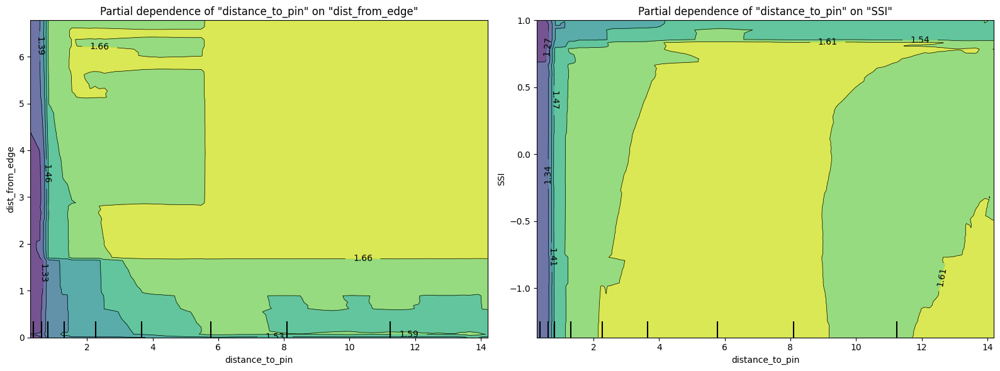

In [25]:
# Create two partial dependence plots
fig, axs = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1
f_names = [('distance_to_pin', 'dist_from_edge')]
disp1 = PartialDependenceDisplay.from_estimator(stack_model_putting, putting_X_train[:450], f_names, ax=axs[0])
axs[0].set_title('Partial dependence of "distance_to_pin" on "dist_from_edge"')

# Plot 2
f_names = [('distance_to_pin', 'SSI')]
disp2 = PartialDependenceDisplay.from_estimator(stack_model_putting, putting_X_train[:450], f_names, ax=axs[1])
#axs[1].set_xlim(-10, 100)
axs[1].set_title('Partial dependence of "distance_to_pin" on "SSI"')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()

In [1]:
# Create two partial dependence plots
fig, axs = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1
f_names = [('dist_from_center', 'dist_from_edge')]
disp1 = PartialDependenceDisplay.from_estimator(stack_model_putting, putting_X_train[:300], f_names, ax=axs[0])
axs[0].set_title('Partial dependence of dist_from_center on dist_from_edge')

# Plot 2
f_names = [('dist_from_center', 'distance_to_pin')]
disp2 = PartialDependenceDisplay.from_estimator(stack_model_putting, putting_X_train[:300], f_names, ax=axs[1])
#axs[1].set_xlim(-10, 100)
axs[1].set_title('Partial dependence of dist_from_center on distance_to_pin')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()

NameError: name 'plt' is not defined

In [ ]:
# X_train_filtered = putting_X_train[putting_X_train['dist_to_pin'].between(0, 4)]

# # Create two partial dependence plots
# fig, axs = plt.subplots(1, 2, figsize=(16, 6))

# # Plot 1
# f_names = [('distance_to_pin', 'dist_from_edge')]
# disp1 = PartialDependenceDisplay.from_estimator(stack_model_putting, X_train_filtered[:450], f_names, ax=axs[0])
# axs[0].set_title('Partial dependence of "distance_to_pin" on "dist_from_edge"')

# # Plot 2
# f_names = [('distance_to_pin', 'SSI')]
# disp2 = PartialDependenceDisplay.from_estimator(stack_model_putting, X_train_filtered[:450], f_names, ax=axs[1])
# #axs[1].set_xlim(-10, 100)
# axs[1].set_title('Partial dependence of "distance_to_pin" on "SSI"')

# # Adjust the layout
# plt.tight_layout()

# # Show the plot
# plt.show()

**Residuals**

In [26]:
final_pipe_results = pd.DataFrame()

final_pipe_results['predicted_distance'] = predicted_distance

final_pipe_results['actual_distance'] = actual_distance

final_pipe_results['residual'] = final_pipe_results['actual_distance'] - final_pipe_results['predicted_distance']

p = figure(height=300, width=300,title="Predicted vs Actual")
p.circle(actual_distance, predicted_distance, size=5, line_color=viridis_palette[180], fill_color=viridis_palette[180], fill_alpha=0.3)
p.xaxis.axis_label = 'Actual'
p.yaxis.axis_label = 'Predicted'

z = figure(height=300, width=300,title="Predicted vs Residual")
z.circle(final_pipe_results.residual, final_pipe_results.predicted_distance, size=5, line_color=viridis_palette[180], fill_color=viridis_palette[180], fill_alpha=0.3)
z.yaxis.axis_label = 'Predicted'
z.xaxis.axis_label = 'Residual'

b = figure(width=600, height=300, toolbar_location=None,
           title="Normality of Residuals")

# Histogram
bins = np.linspace(-0.5, 0.5, 100)
hist, edges = np.histogram(final_pipe_results.residual, density=True, bins=bins)
b.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:],
         fill_color=viridis_palette[180], line_color="white")

b.y_range.start = 0
b.x_range.start = -0.5
b.x_range.end = 0.5

b.xaxis.axis_label = "Residuals"
b.yaxis.axis_label = "Distribution Count"

grid = gridplot([[row(p,z)], 
                 [b]])
show(grid)

**[Permutaion Importance](https://scikit-learn.org/stable/modules/generated/sklearn.inspection.permutation_importance.html)**

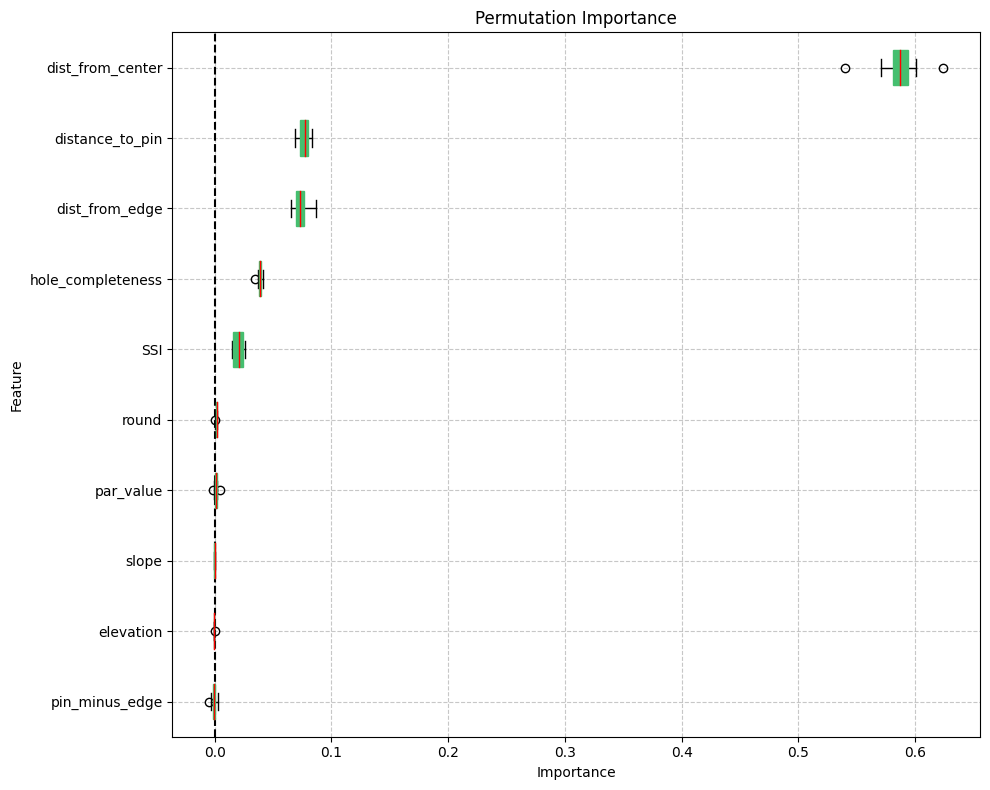

In [27]:
result = permutation_importance(stack_model_putting, 
                                putting_X_train, 
                                putting_y_train.values.ravel(), 
                                n_repeats=10,
                                random_state=42)

fig, ax = plt.subplots(figsize=(10, 8))  # Adjust size for better readability and aesthetics

perm_sorted_idx = result.importances_mean.argsort()

# Customize boxplot appearance
box = ax.boxplot(
    result.importances[perm_sorted_idx].T,
    vert=False,
    patch_artist=True,  # Enable filling colors
    boxprops=dict(facecolor=viridis_palette[180], color=viridis_palette[180]),  # Box color customization
    whiskerprops=dict(color='black'),  # Whisker color customization
    capprops=dict(color='black'),  # Cap color customization
    medianprops=dict(color='red')  # Median line color customization
)

# Set labels and title
ax.set_yticklabels(putting_X_train.columns[perm_sorted_idx])
ax.set_xlabel('Importance')
ax.set_ylabel('Feature')
ax.set_title('Permutation Importance')

# Add a grid for better readability
ax.grid(True, linestyle='--', alpha=0.7)

# Add a vertical line at x=0
ax.axvline(x=0, color="black", linestyle="--")

# Customize layout
plt.tight_layout()

plt.show()

**Add in Joblib and BZ2**

In [28]:
# with bz2.BZ2File('compressed_final_putting_model.joblib.bz2', 'wb', compresslevel=9) as f:
#     joblib.dump(stack_model_putting, f)